In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

%matplotlib inline

In [74]:
def one_by_two_plot(img1_dict, img2_dict, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
    ax1.imshow(img1_dict['img'], cmap=cmap)
    ax1.set_title(img1_dict.get('title', ''))
    ax2.imshow(img2_dict['img'], cmap=cmap)
    ax2.set_title(img2_dict.get('title', ''))

### Attempt to find chessboard corners on distorted camera images
Looks like for some images, we could not fins the 9 X 6 inner corners

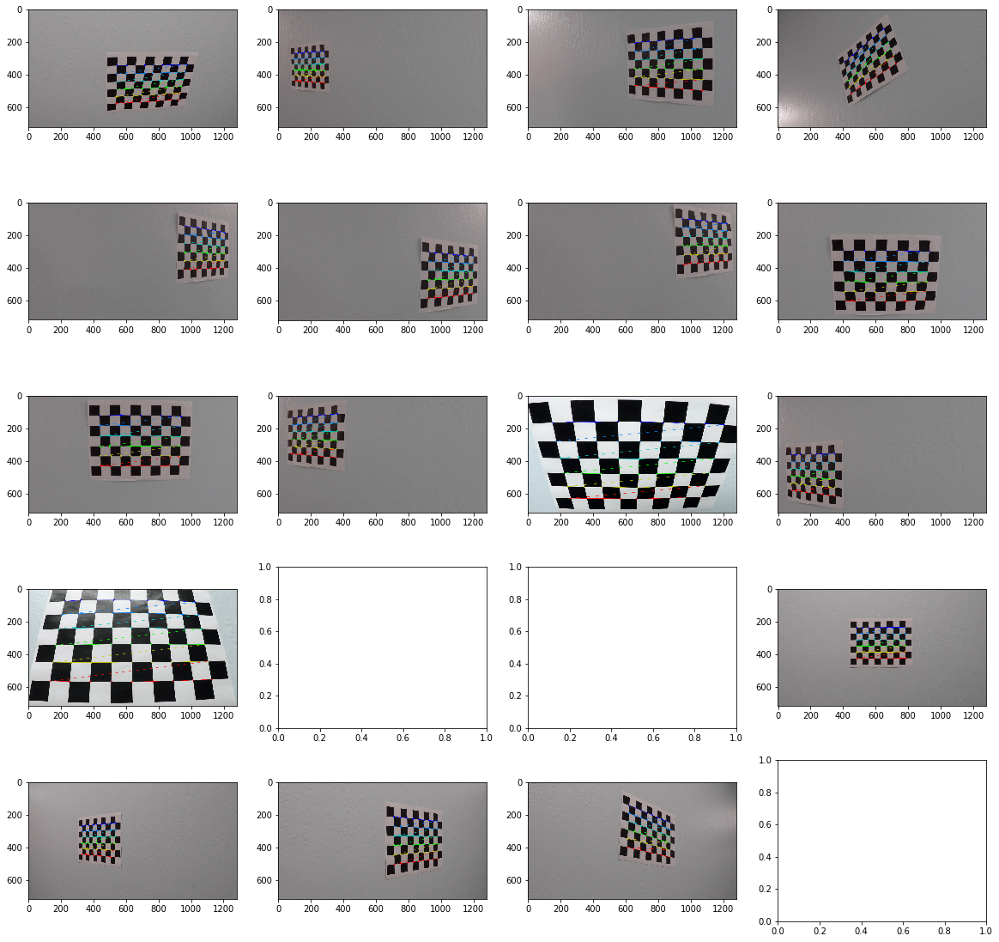

In [15]:
#preparing real world/target/reference object point triplets
objp = np.zeros((6 * 9, 3), np.float32)
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

# for storing object points and image points from sample images
objpoints, imgpoints = [], []

images = glob.glob('./camera_cal/calibration*.jpg')
plt.subplots(5, 4, figsize=(20, 20))
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.subplot(5, 4, idx)
        plt.imshow(img)


### Using the identified corners from multiple images, caliberate the camera, i.e. offset for distortion and eventually undistort the images above

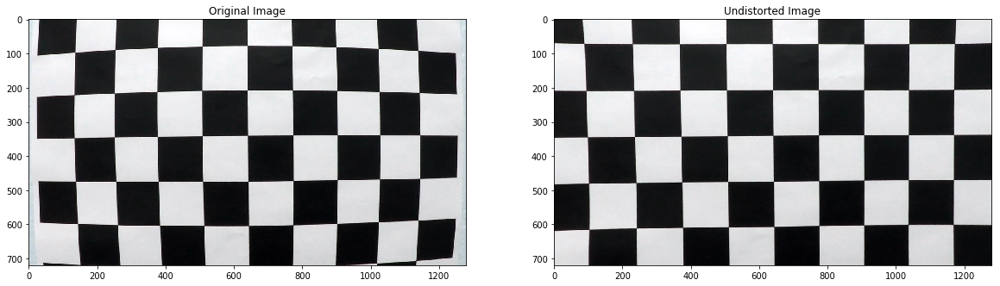

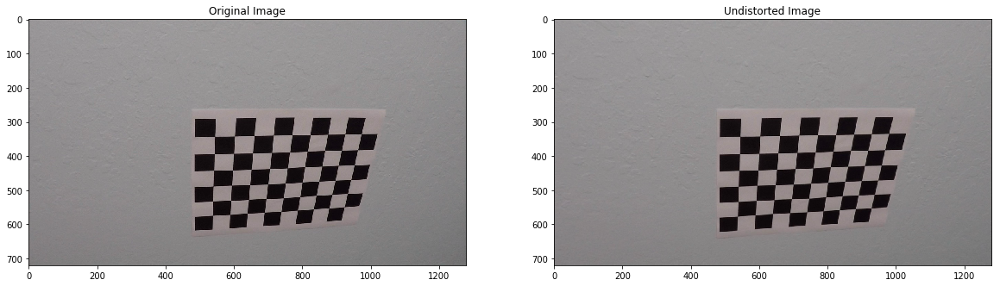

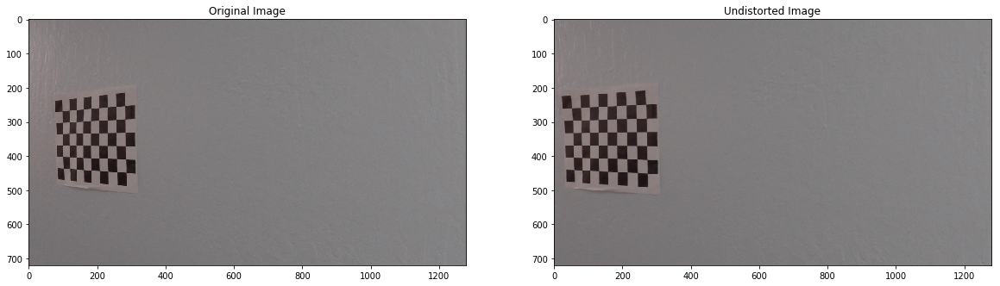

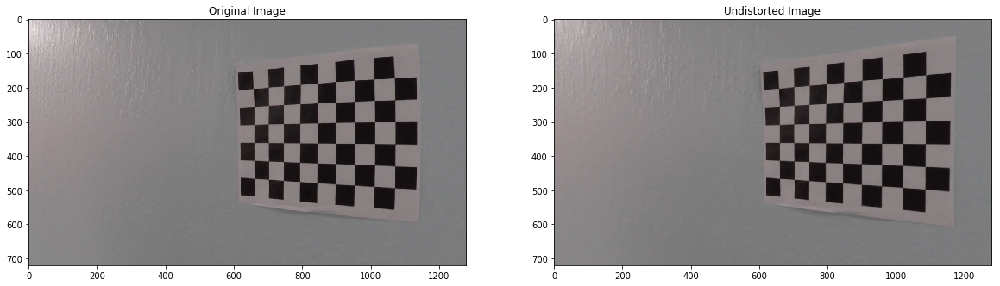

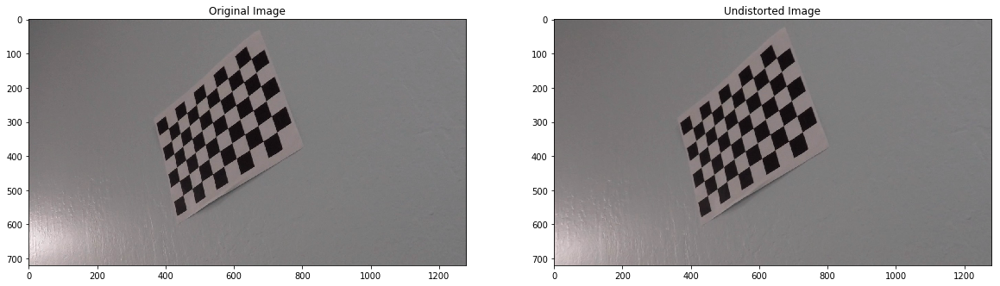

...

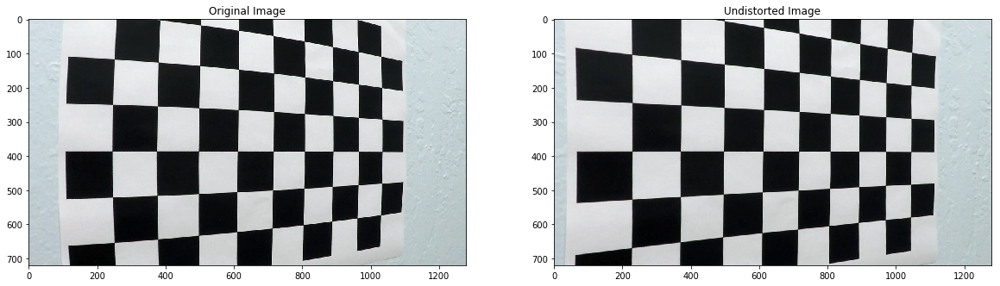

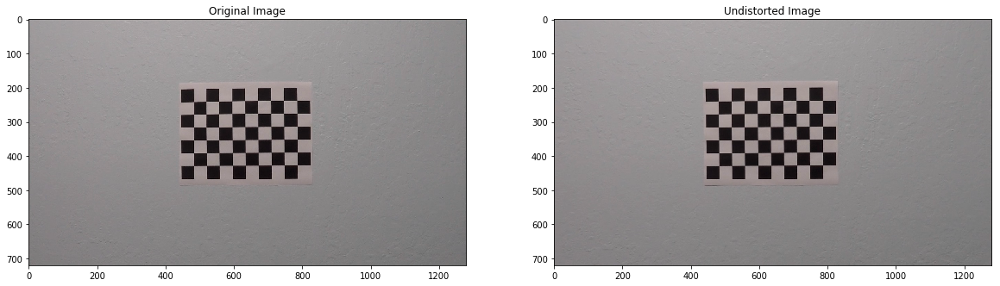

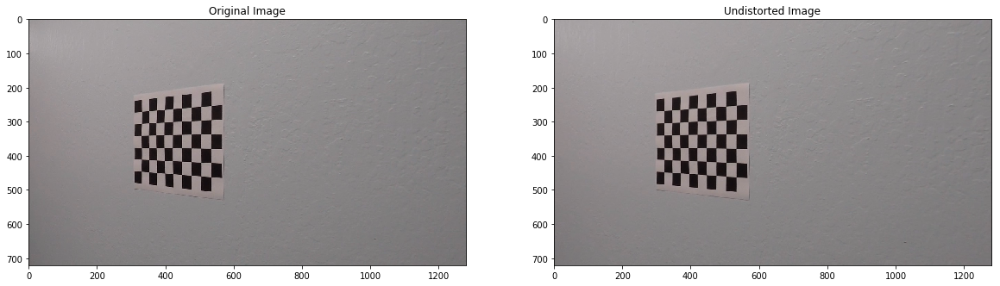

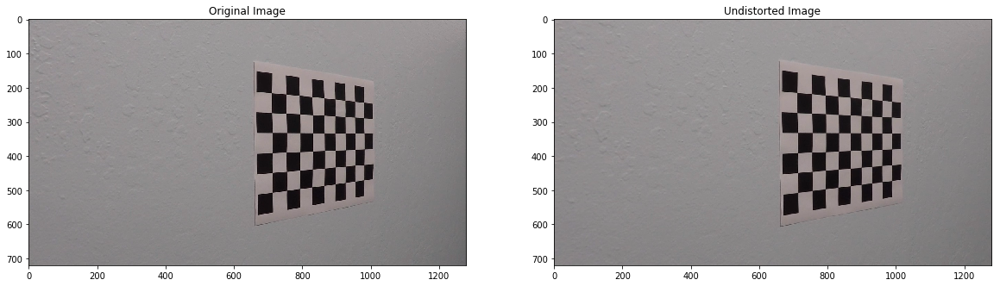

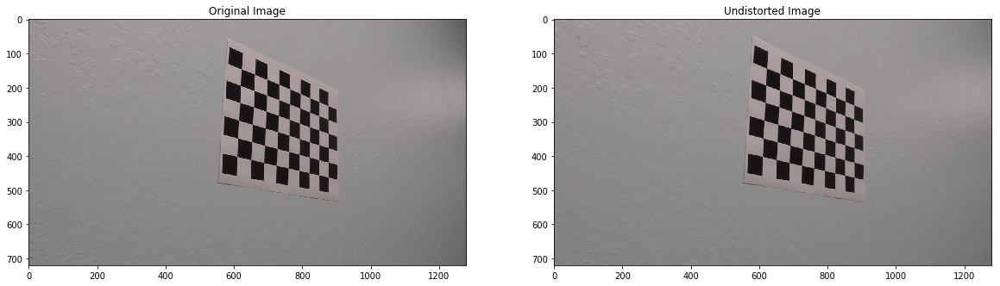

In [65]:
images = glob.glob('./camera_cal/calibration*.jpg')
for idx, fname in enumerate(images):
    test_img = cv2.imread(fname)
    img_size = test_img.shape[1], test_img.shape[0]
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    dst = cv2.undistort(test_img, mtx, dist, None, mtx)
    one_by_two_plot({'img': test_img, 'title': 'Original Image'}, {'img': dst, 'title': 'Undistorted Image'})

### With the computed camera caliberation matrices and distortion coefficients, use it to undistort an image captured from carmount camera
Assuming the same camera that was used to capture sample chessboard pictures is also used on the carmount to capture images of the lane lines so that the coeffs can be shared

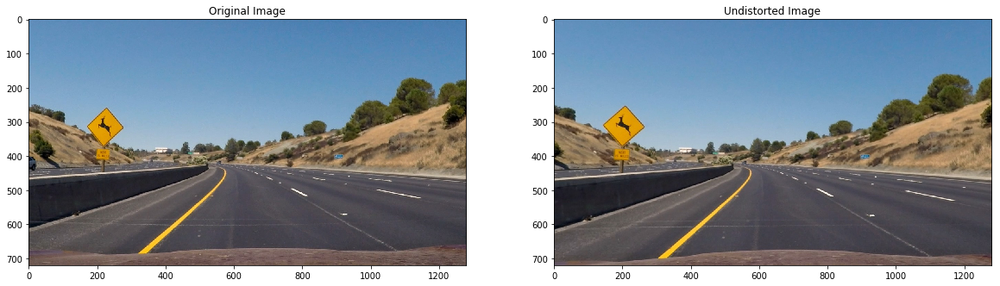

In [68]:
test_car_img = cv2.imread('./test_images/test2.jpg')
test_car_img = cv2.cvtColor(test_car_img, cv2.COLOR_BGR2RGB)
undist_car_img = cv2.undistort(test_car_img, mtx, dist, None, mtx)
one_by_two_plot({'img': test_car_img, 'title': 'Original Image'}, {'img': undist_car_img, 'title': 'Undistorted Image'})

The undistortion is subtle but can be identified by closly observing:
    * The deer sign appears closer than original
    * THe hood of self car's shape being changed

### Perspective Transform
For better manipulation of image lines, we would be converting given lane images to a bird's eye view perspective, so the lane lines actually are parallel. With this radius of curvature etc can be hhoped to be calculated

In [57]:
def unwarp_img(img, src_quad, dest_quad):
    '''unwarp a given image based on source quadruplet points. The image on thw hole would be
       unwarped to fit to destination quadruplet points
    '''
    rows, cols = img.shape[:2]
    # fetch transform and inverse matrices
    M, Minv = cv2.getPerspectiveTransform(src_quad, dest_quad), cv2.getPerspectiveTransform(dest_quad, src_quad)
    warped = cv2.warpPerspective(img, M, (cols, rows), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

Text(0.5,1,'Birds eye view image')

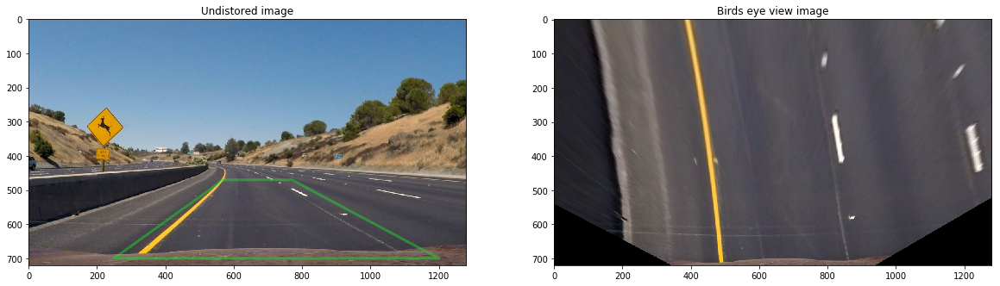

In [62]:
rows, cols = undist_car_img.shape[:2]
src_quad = np.float32([(570, 470), (250, 700), (1200, 700), (770, 470)])
dest_quad = np.float32([(400, 0), (460, 720), (900, 720), (900, 0)])
test_car_unwarped, M, Minv = unwarp_img(test_car_img, src_quad, dest_quad)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
ax1.imshow(test_car_img)
x = [src_quad[0][0],src_quad[1][0],src_quad[2][0],src_quad[3][0],src_quad[0][0]]
y = [src_quad[0][1],src_quad[1][1],src_quad[2][1],src_quad[3][1],src_quad[0][1]]
ax1.plot(x, y, color='#16F529', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([rows, 0])
ax1.set_xlim([0, cols])
ax1.set_title('Undistored image')
ax2.imshow(test_car_unwarped)
ax2.set_title('Birds eye view image')

### Moving on to experimenting with different color spaces, gradients and thresholds to amplify lane lines

#### Sobel Abs Threshold

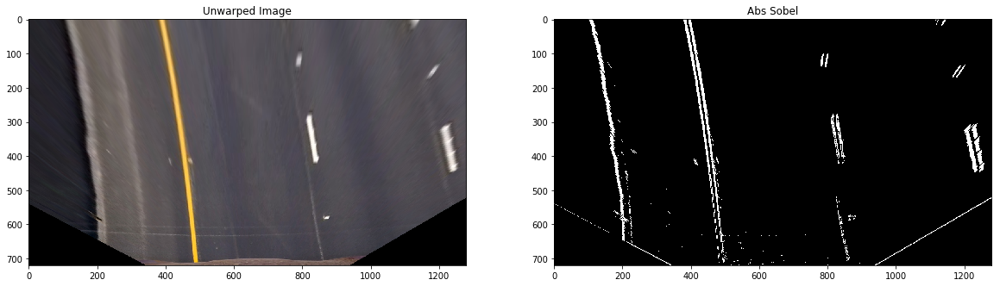

In [80]:
def sobel_abs_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

abs_sob = sobel_abs_thresh(test_car_unwarped, thresh_min=20, thresh_max=100)
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': abs_sob, 'title': 'Abs Sobel'}, cmap='gray')


#### Sobel Mag Threshold

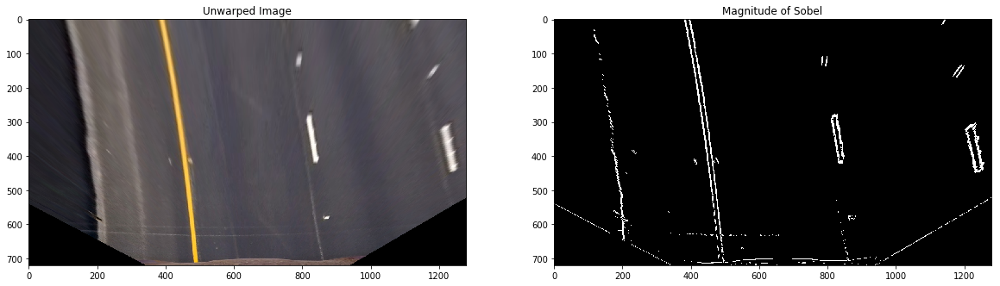

In [81]:
def sobel_mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx, sobely = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel), cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobel_mag = np.sqrt(sobelx ** 2 + sobely ** 2)
    scaled_mag = np.uint8(255 * sobel_mag / np.max(sobel_mag))
    binary_output = np.zeros_like(scaled_mag)
    binary_output[(scaled_mag > mag_thresh[0]) & (scaled_mag < mag_thresh[1])] = 1
    return binary_output
    
mag_binary = sobel_mag_thresh(test_car_unwarped, sobel_kernel=3, mag_thresh=(30, 100))
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': mag_binary, 'title': 'Magnitude of Sobel'}, cmap='gray')

#### Direction of Sobel

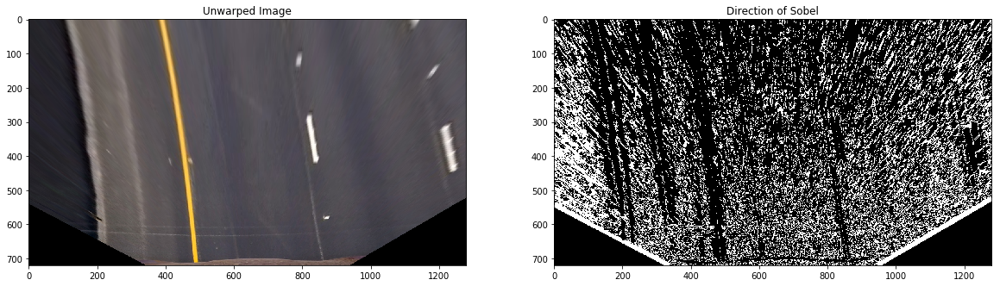

In [82]:
def sobel_dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sx, sy = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel), cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sx, abs_sy = np.absolute(sx), np.absolute(sy)
    grd_angle = np.arctan2(abs_sy, abs_sx)
    binary_output = np.zeros_like(grd_angle)
    binary_output[(grd_angle >= thresh[0]) & (grd_angle <= thresh[1])] = 1 # Remove this line
    return binary_output

dir_binary = sobel_dir_thresh(test_car_unwarped, sobel_kernel=15, thresh=(0.7, 1.3))
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': dir_binary, 'title': 'Direction of Sobel'}, cmap='gray')


##### All the above sobel gradient related filtering seems to be OK (direction is horrible) however, they do seem to have redundant noise

### HLS color space transform

In [156]:
def hls_thresh(img, channel='s', thresh=(220, 255)):
    hls_map = {'h': 0, 'l': 1, 's': 2}
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    ch_img = hls_img[:, :, hls_map[channel]]
    binary_output = np.zeros_like(ch_img)
    binary_output[(ch_img > thresh[0]) & (ch_img <= thresh[1])] = 1
    return binary_output

#### H channel

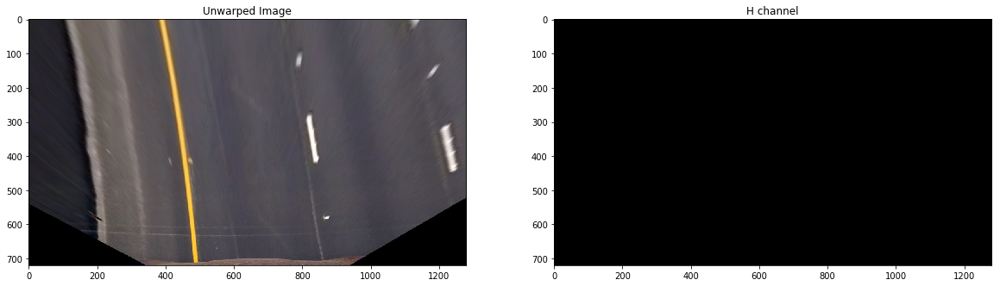

In [157]:
h = hls_thresh(test_car_unwarped, channel='h')
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': h, 'title': 'H channel'}, cmap='gray')


#### L chanel

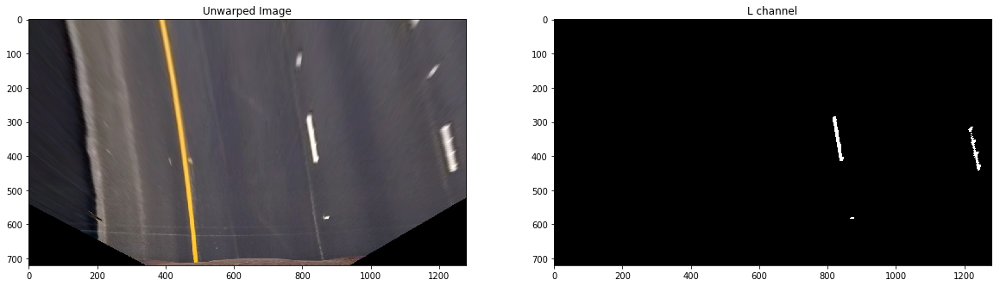

In [158]:
l = hls_thresh(test_car_unwarped, channel='l')
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': l, 'title': 'L channel'}, cmap='gray')


#### S Channel

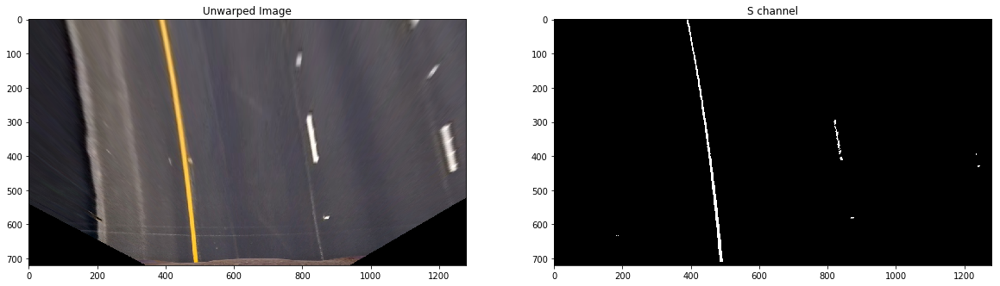

In [159]:
s = hls_thresh(test_car_unwarped, channel='s')
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': s, 'title': 'S channel'}, cmap='gray')


#### Testing out LAB color space

In [114]:
def lab_thresh(img, channel='L', thresh=(180, 255)):
    lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_map = {'L': 0, 'A': 1, 'B': 2}
    ch_img = lab_img[:, :, lab_map[channel]]
    # normalize if there are yellows in the image
    if np.max(ch_img) > 170 and channel == 'B':
        ch_img = ch_img * (255 / np.max(ch_img))
    binary_out = np.zeros_like(ch_img)
    binary_out[(ch_img > thresh[0]) & (ch_img <= thresh[1])] = 1
    return binary_out



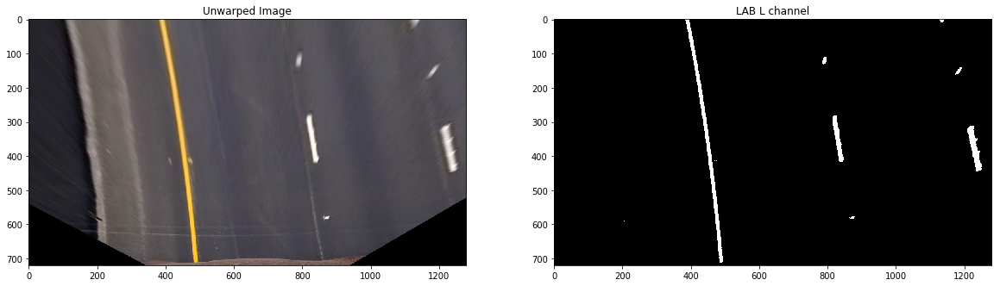

In [115]:
lab_l = lab_thresh(test_car_unwarped, channel='L', thresh=(180, 255))
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': lab_l, 'title': 'LAB L channel'}, cmap='gray')


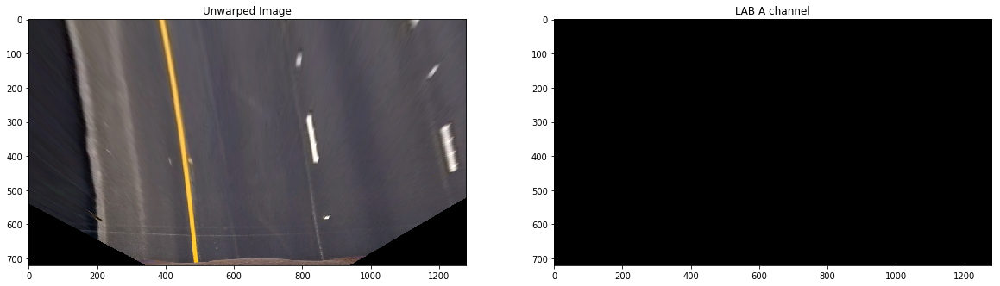

In [116]:
lab_a = lab_thresh(test_car_unwarped, channel='A', thresh=(180, 255))
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': lab_a, 'title': 'LAB A channel'}, cmap='gray')


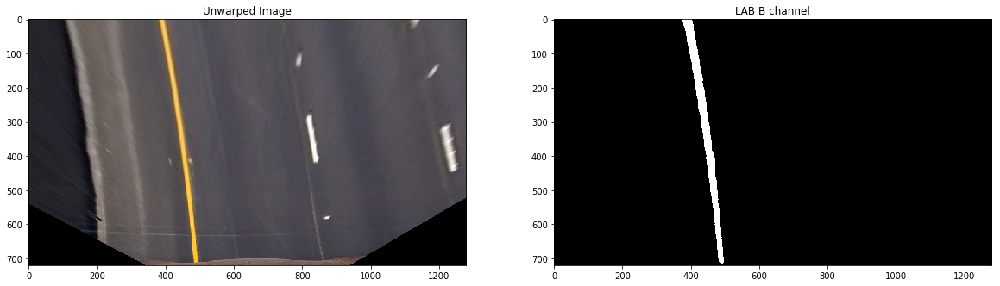

In [129]:
lab_b = lab_thresh(test_car_unwarped, channel='B', thresh=(180, 255))
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': lab_b, 'title': 'LAB B channel'}, cmap='gray')


#### LAB B seems to performing extremely well for the shoulder yellow line. However, it is completely ignoring the dashed lane lines
We would have to OR( | ) it with a color space which does a good job of capturing klane lines without too much noise. A few potential candidates can be:
* LAB L channel
* HLS L channel

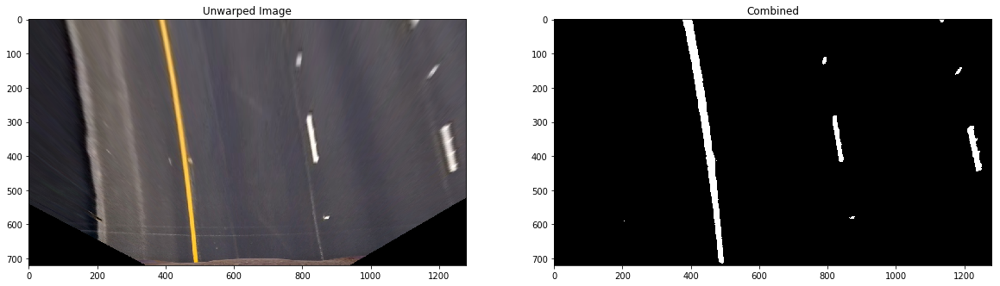

In [147]:
combined = np.zeros_like(lab_b)
combined[(lab_b == 1) | (lab_l == 1)] = 1
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': combined, 'title': 'Combined'}, cmap='gray')


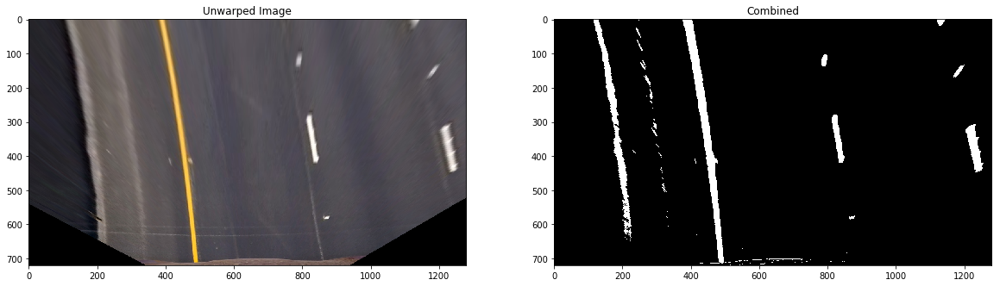

In [151]:
combined = np.zeros_like(lab_b)
combined[(lab_b == 1) | (l == 1)] = 1
one_by_two_plot({'img': test_car_unwarped, 'title': 'Unwarped Image'}, {'img': combined, 'title': 'Combined'}, cmap='gray')


## Pipeline

In [160]:
def pipeline(bgr_img):
    undistorted_img = cv2.undistort(rgb_img, mtx, dist, None, mtx)
    unwarped_img, M, Minv = unwarp_img(undistorted_img, src_quad, dest_quad)
    lab_b = lab_thresh(unwarped_img, channel='B')
    #lab_l = lab_thresh(unwarped_img, channel='L')
    hls_l = hls_thresh(unwarped_img, channel='l')
    combined = np.zeros_like(lab_b)
    combined[(lab_b == 1) | (hls_l == 1)] = 1
    return combined


### Test pipeline on all test images

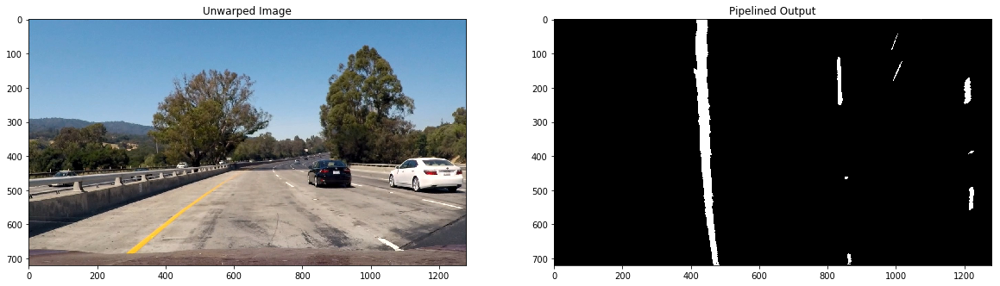

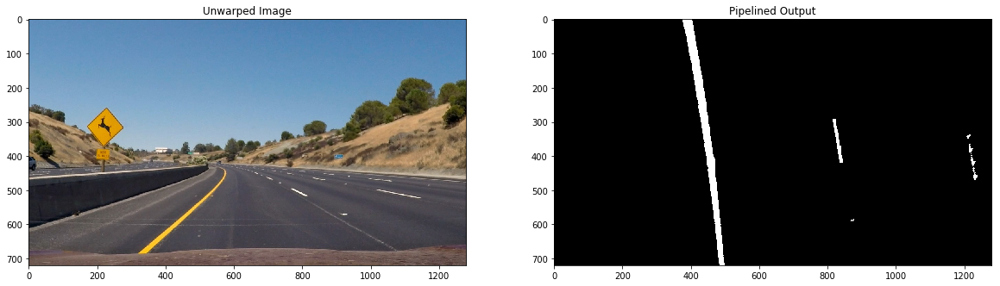

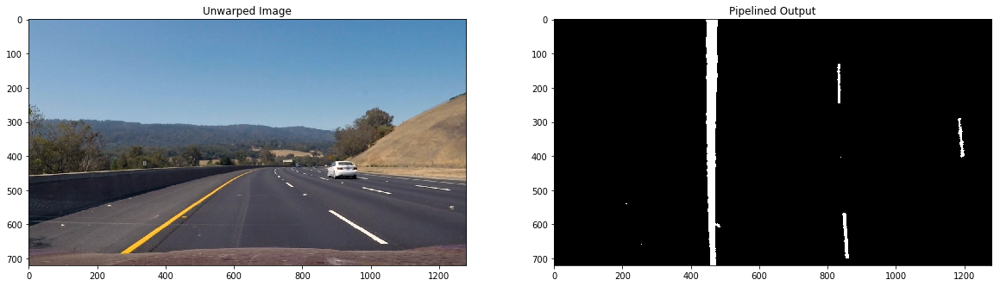

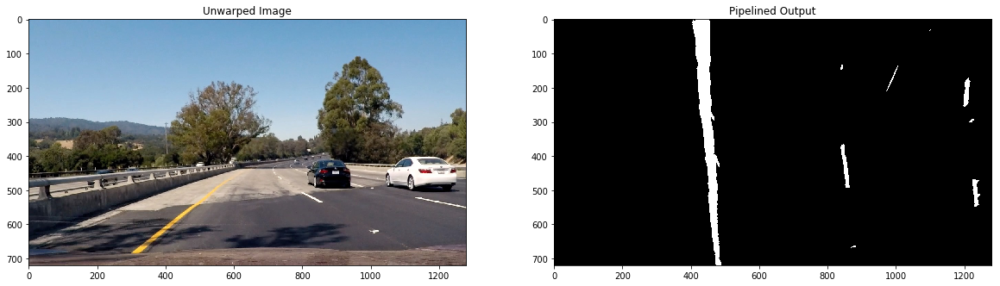

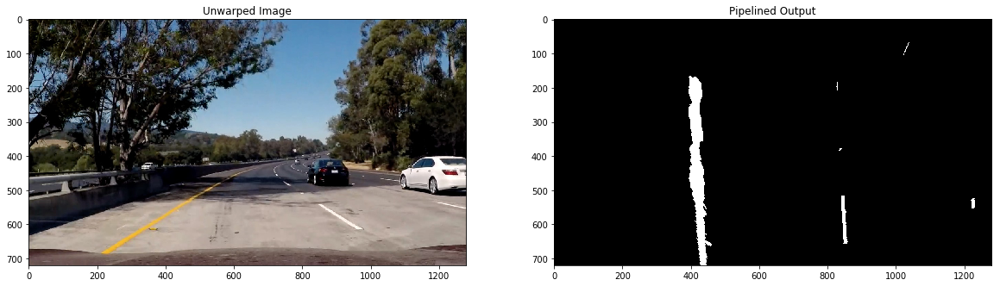

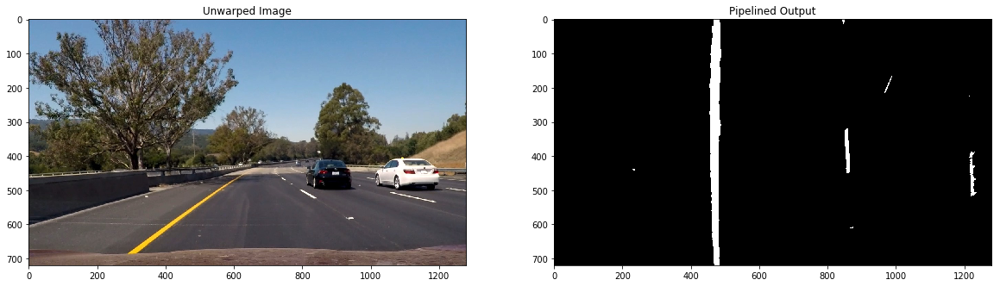

In [257]:
images = glob.glob('./test_images/test*.jpg')
pipeline_outputs = []
for idx, fname in enumerate(images):
    bgr_img = cv2.imread(fname)
    rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
    pipelined = pipeline(rgb_img)
    pipeline_outputs.append(pipelined)
    one_by_two_plot(
    {'img': rgb_img, 'title': 'Unwarped Image'}, 
    {'img': pipelined, 'title': 'Pipelined Output'}, 
    cmap='gray'
)

## Sliding Window approach to pinpoint pixels for the hot lane lines

In [269]:
def sliding_window_with_polyfit(binary_warped, nwindows=9, margin=100, minpix=50):
    '''
    :param np.ndarray binary_warped: warped birds eye image after 
         applying color/gradient thresholds resulting in a binary img
    :param int nwindows: Number of sliding windows
    :param int margin: +/- buffer for width of window
    :param int minpix: min pix found to recenter window
    '''
    # compute histogram of bottom half of the image along Y axis/columns
    hist = np.sum(binary_warped[binary_warped.shape[0]//2:, :], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Estimate the peaks from the histogram which would be the base of our search for left and right lanes
    mid = np.int(hist.shape[0]//2)
    left_base = np.argmax(hist[:mid])
    right_base = np.argmax(hist[mid:]) + mid
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = left_base
    rightx_current = right_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    return left_fit, right_fit, left_lane_inds, right_lane_inds



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[1.67128102e-05 5.84620956e-02 4.28737571e+02]


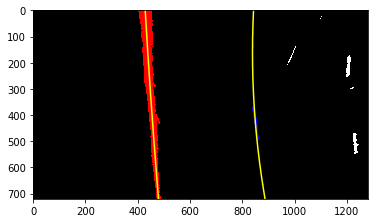

In [271]:
img = pipeline_outputs[3]
left_fit, right_fit, left_lane_inds, right_lane_inds = sliding_window_with_polyfit(img)
print(left_fit)

In [252]:

# Define method to fit polynomial to binary image based upon a previous fit (chronologically speaking);# Define  
# this assumes that the fit will not change significantly from one video frame to the next
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds
print('...')

...


[ 4.60368758e-05 -3.41366999e-02  4.75161876e+02]
...


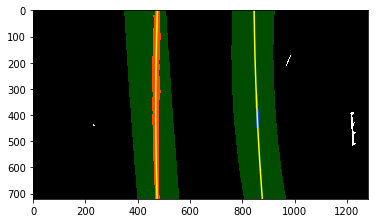

In [290]:
# visualize the result on example image
img_raw = cv2.imread('./test_images/test3.jpg')
img_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
bin_img = pipeline(img_raw)
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(bin_img, left_fit, right_fit)
print(left_fit2)
# Generate x and y values for plotting
ploty = np.linspace(0, bin_img.shape[0]-1, bin_img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((bin_img, bin_img, bin_img))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = bin_img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
print('...')


In [293]:
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist
print('...')

...


In [295]:
rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(bin_img, left_fit, right_fit, left_lane_inds2, right_lane_inds2)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')


Radius of curvature for example: 1030.9871009667022 m, 1060.1123813935583 m
Distance from lane center for example: -0.4222322153114578 m


In [296]:

def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result
print('...')

...


...


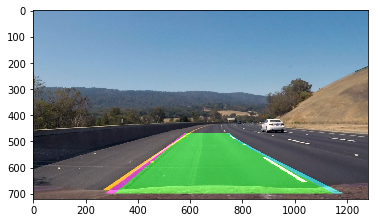

In [301]:
img_lane_drawn = draw_lane(img_raw, bin_img, left_fit, right_fit, Minv)
plt.imshow(img_lane_drawn)
print('...')

In [299]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img
print('...')


...


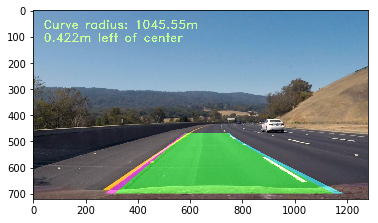

In [302]:

exampleImg_out2  = draw_data(img_lane_drawn, (rad_l+rad_r)/2, d_center)
plt.imshow(exampleImg_out2)
